# 1.	Importing Lybraries

In [1]:
import pandas as pd
import numpy as np
from scipy import stats
from sklearn import preprocessing
from sklearn import decomposition
from sklearn.preprocessing import StandardScaler, normalize
from math import ceil
import matplotlib.pyplot as plt
import seaborn as sns
#from pandas_profiling import ProfileReport
from os.path import join
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.cm as cm
from sklearn.metrics import silhouette_score, silhouette_samples
from yellowbrick.cluster import SilhouetteVisualizer
from yellowbrick.cluster.elbow import KElbowVisualizer
from sklearn.mixture import GaussianMixture
from IPython.display import YouTubeVideo
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.neighbors import KNeighborsClassifier
from scipy.cluster.hierarchy import dendrogram
import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView
import warnings
warnings.filterwarnings('ignore')

# 2. Load the dataset

In [2]:
#loading the Wonderful Wines of the World data
data = pd.read_excel('WonderfulWinesoftheWorld.xlsx') 
data.drop(['Rand'], axis=1)

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,WebVisit,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend
0,5325.0,653.000,55.0000,20.0000,78473.000,0.0000,0.0000,20.0000,18.0000,826.0000,...,5.0000,0,0,0,0,0,0,0,0,0
1,3956.0,1041.000,75.0000,18.0000,105087.000,0.0000,0.0000,36.0000,33.0000,1852.0000,...,4.0000,0,0,0,1,0,0,0,0,0
2,3681.0,666.000,18.0000,12.0000,27984.000,1.0000,0.0000,4.0000,56.0000,39.0000,...,8.0000,0,0,0,0,0,0,0,0,0
3,2829.0,1049.000,42.0000,16.0000,61748.000,1.0000,1.0000,2.0000,46.0000,37.0000,...,7.0000,0,0,0,0,0,0,0,1,1
4,8788.0,837.000,47.0000,16.0000,65789.000,0.0000,1.0000,2.0000,3.0000,36.0000,...,6.0000,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,4070.0,596.000,66.0000,15.0000,84714.000,0.0000,0.0000,18.0000,45.0000,720.0000,...,2.0000,0,0,0,0,0,0,0,0,0
9997,7909.0,619.000,18.0000,12.0000,40466.000,0.0000,0.0000,3.0000,65.0000,47.0000,...,5.0000,0,0,0,0,0,0,0,0,0
9998,4158.0,1107.000,33.0000,16.0000,53661.000,1.0000,0.0000,1.0000,368.0000,15.0000,...,6.0000,0,0,0,0,0,0,0,0,0
9999,4914.0,979.000,55.0000,16.0000,94926.000,0.0000,1.0000,25.0000,28.0000,1148.0000,...,5.0000,0,0,0,0,0,0,0,0,0


# 3. Explore the dataset

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10001 entries, 0 to 10000
Data columns (total 30 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Custid       10000 non-null  float64
 1   Dayswus      10001 non-null  float64
 2   Age          10001 non-null  float64
 3   Edu          10001 non-null  float64
 4   Income       10001 non-null  float64
 5   Kidhome      10001 non-null  float64
 6   Teenhome     10001 non-null  float64
 7   Freq         10001 non-null  float64
 8   Recency      10001 non-null  float64
 9   Monetary     10001 non-null  float64
 10  LTV          10001 non-null  float64
 11  Perdeal      10001 non-null  float64
 12  Dryred       10001 non-null  float64
 13  Sweetred     10001 non-null  float64
 14  Drywh        10001 non-null  float64
 15  Sweetwh      10001 non-null  float64
 16  Dessert      10001 non-null  float64
 17  Exotic       10001 non-null  float64
 18  WebPurchase  10001 non-null  float64
 19  WebV

In [5]:
data.head()

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand
0,5325.0,653.0,55.0,20.0,78473.0,0.0,0.0,20.0,18.0,826.0,...,0,0,0,0,0,0,0,0,0,0.240092
1,3956.0,1041.0,75.0,18.0,105087.0,0.0,0.0,36.0,33.0,1852.0,...,0,0,0,1,0,0,0,0,0,0.435944
2,3681.0,666.0,18.0,12.0,27984.0,1.0,0.0,4.0,56.0,39.0,...,0,0,0,0,0,0,0,0,0,0.350584
3,2829.0,1049.0,42.0,16.0,61748.0,1.0,1.0,2.0,46.0,37.0,...,0,0,0,0,0,0,0,1,1,0.594082
4,8788.0,837.0,47.0,16.0,65789.0,0.0,1.0,2.0,3.0,36.0,...,0,0,0,0,0,0,0,0,0,0.782248


In [6]:
len(data.Custid.unique())

10001

In [7]:
# Summary statistics for all variables
data.describe(include='all').transpose()

,count,mean,std,min,25%,50%,75%,max
Custid,10000.0,6000.500000,2886.895680,1001.000000,3500.750000,6000.500000,8500.250000,11000.000000
Dayswus,10001.0,898.102000,202.482664,550.000000,724.000000,894.000000,1074.000000,1250.000000
Age,10001.0,47.927300,17.301856,18.000000,33.000000,48.000000,63.000000,78.000000
Edu,10001.0,16.739100,1.876281,12.000000,15.000000,17.000000,18.000000,20.000000
Income,10001.0,69904.358000,27610.852665,10000.000000,47646.000000,70009.000000,92147.000000,140628.000000
Kidhome,10001.0,0.418800,0.493363,0.000000,0.000000,0.000000,1.000000,1.000000
Teenhome,10001.0,0.469800,0.499087,0.000000,0.000000,0.000000,1.000000,1.000000
Freq,10001.0,14.628100,11.968475,1.000000,4.000000,12.000000,24.000000,56.000000
Recency,10001.0,62.406800,69.870762,0.000000,26.000000,52.000000,78.000000,549.000000
Monetary,10001.0,622.555200,647.102966,6.000000,63.000000,383.000000,1077.000000,3052.000000


In [8]:
non_metric_features = ['Kidhome','Teenhome','SMRack','LGRack', 'Humid', 'Spcork', 'Bucket', 'Access', 'Complain', 'Mailfriend','Emailfriend']
metric_features = data.columns.drop(non_metric_features).to_list()
metric_features.remove('Custid')
metric_features.remove('Rand')

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=11.0.
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 3.335
findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 2.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: 

findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Extra Bold' (ROCKEB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Comic Sans MS' (comicz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Arial' (ariali.ttf) italic normal 400 normal>) = 1.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 7

findfont: score(<Font 'Lucida Fax' (LFAXDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Freestyle Script' (FREESCPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cooper Black' (COOPBL.TTF) normal normal black normal>) = 10.525
findfont: score(<Font 'Maiandra GD' (MAIAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Ebrima' (ebrimabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) n

findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal bold condensed>) = 10.535
findfont: score(<Font 'Leelawadee' (LEELAWDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (NirmalaS.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal light norma

findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee' (LEELAWAD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Wide Latin' (LATINWD.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKV

findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCM_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHV.TTF) normal normal heavy normal>) = 10.43
findfont: score(<Font 'Rockwell' (ROCKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 

findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Old English Text MT' (OLDENGL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal demi condensed>) = 10.44
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Modern No. 20' 

findfont: score(<Font 'Microsoft JhengHei' (msjhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCB_____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal black normal>) = 10.525
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe MDL2 Assets' (segmdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisbi.ttf) italic normal semibold normal>) = 11.24
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'Myanmar Text' (mmrtext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal book normal>) = 11.05
findfont: score(<Font 'Candara' (C

findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal regular normal>) = 10.05
findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'cmb10' (cmb10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeTwoSym' (STIXSizTwoSymBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Oblique.ttf) oblique normal 400 normal>) = 11.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'STIXSizeThreeSym' 

findfont: score(<Font 'Mistral' (MISTRAL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Showcard Gothic' (SHOWG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal light normal>) = 11.24
findfont: score(<Font 'Lucida Bright' (LBRITEDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft Himalaya' (himalaya.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUABI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Nirmala UI' (NirmalaS.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Algerian' (ALGER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookshelf Symbol 7' (BSSYM7.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Kunstler Script' (

findfont: score(<Font 'Magneto' (MAGNETOB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CI.TTF) italic normal 400 condensed>) = 11.25
findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Harrington' (HARNGTON.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibriz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Poor Richard' (POORICH.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHIC.TTF) 

findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Britannic Bold' (BRITANIC.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Broadway' (BROADW.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua Titling MT' (PERTILI.TTF) normal normal light normal>) = 10.24
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Console' (lucon.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Kunstler Script' (KUNSTLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Fon

findfont: score(<Font 'Stencil' (STENCIL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Pristina' (PRISTINA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal medium normal>) = 10.145
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_B.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Palatino Linotype' (pala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Arial

findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.535
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-MEDIUM.TTF) normal normal medium normal>) = 10.145
findfont: score(<Font 'Agency FB' (AGENCYR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consolaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Blackadder ITC' (ITCBLKAD.TTF) normal normal black normal>) = 10.525
findfont: score(<Font 'Bodoni MT' (BOD_CI.TTF) italic normal 400 condensed>) = 11.25
findfont: score(<Font 'Garamond' (GARAIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'OCR A Extended' (OCRAEXT.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Freestyle Script' (FREESCPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee' (LEELAWAD.TTF) norm

findfont: score(<Font 'Perpetua' (PERI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal light normal>) = 10.24
findfont: score(<Font 'Tw Cen MT' (TCB_____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Javanese Text' (javatext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Ebrima' (ebrima.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MS Reference Sans Serif' (REFSAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Perpetua' (PERBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (NirmalaB.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI' (segoeuisl.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Goudy Stout

findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Corbel' (corbell.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Goudy Old Style' (GOUDOSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Showcard Gothic' (SHOWG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Nirmala UI' (Nirmala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Trebuchet MS' (trebucbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Uighur' (MSUIGHUB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal book normal>) = 11.05
findfont: score(<Font 'Broadway' (BROADW.TTF) 

findfont: score(<Font 'Vivaldi' (VIVALDII.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Calisto MT' (CALISTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Candara' (Candaral.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Courier New' (couri.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe Script' (segoescb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans' (LSANS.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft Sans Serif' (micross.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Bright' (LBRITED.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe UI' (seguili.ttf) ita

findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Consolas' (consola.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Viner Hand ITC' (VINERITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sylfaen' (sylfaen.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Constantia' (constani.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Old Style' (GOUDOSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Fax' (LFAXD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Informal Roman' (INFROMAN.TTF) norm

findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal medium normal>) = 10.145
findfont: score(<Font 'Segoe Print' (segoeprb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Gill Sans MT Condensed' (GILC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Bodoni MT' (BOD_BI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Times New Roman' (timesi.ttf) italic normal roman normal>) = 11.145
findfont: score(<Font 'Trebuchet MS' (trebuc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal demi normal>) = 10.24
findfont

findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Perpetua' (PER_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Microsoft Yi Baiti' (msyi.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Eras Light ITC' (ERASLGHT.TTF) normal normal light normal>) = 10.24
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Verdana' (verdanai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft YaHei' (msyhl.ttc) normal normal light normal>) = 10.24
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gabriola' (Gabriola.ttf) normal normal 400 normal>) 

findfont: score(<Font 'Rockwell Condensed' (ROCC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Tw Cen MT' (TCMI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Californian FB' (CALIFR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Palatino Linotype' (palai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Franklin Gothic Medium' (framd.ttf) normal normal medium normal>) = 10.145
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Britannic Bold' (BRITANIC.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Berlin Sans FB' (BRLNSR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: scor

findfont: score(<Font 'Goudy Old Style' (GOUDOS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Centaur' (CENTAUR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisli.ttf) italic normal light normal>) = 11.24
findfont: score(<Font 'Gadugi' (gadugib.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Calibri' (calibriz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Edwardian Script ITC' (ITCEDSCR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Juice ITC' (JUICE___.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Snap ITC' (SNAP____.TTF) normal normal 40

findfont: score(<Font 'Impact' (impact.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaZ.ttc) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Vladimir Script' (VLADIMIR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal black normal>) = 0.525
findfont: score(<Font 'Georgia' (georgiaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Palace Script MT' (PALSCRI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 0.25
findfont: score(<Font 'MV Boli' (mvboli.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriaz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Candara' (Candarali.ttf) italic normal light normal>) = 11.24
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal 700 condensed>) = 11.

findfont: score(<Font 'Corbel' (corbelli.ttf) italic normal light normal>) = 11.24
findfont: score(<Font 'Garamond' (GARABD.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Book Antiqua' (ANTQUAB.TTF) normal normal 700 normal>) = 10.335
findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=14.399999999999999 to Arial ('C:\\Windows\\Fonts\\arial.ttf') with score of 0.050000.


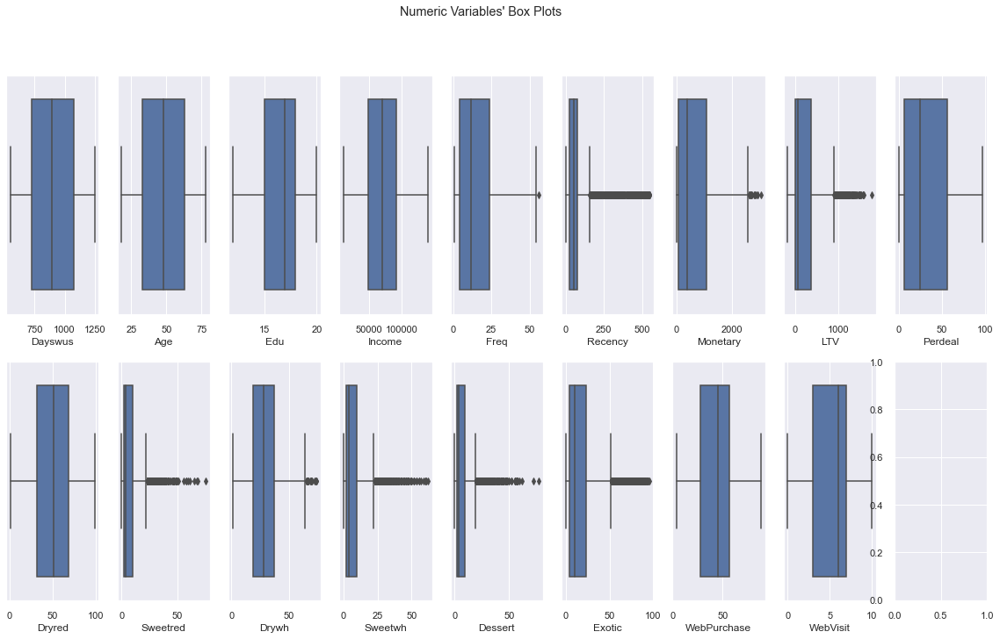

In [9]:
# All Numeric Variables' Box Plots in one figure
sns.set()
# Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(2, ceil(len(metric_features) / 2), figsize=(20, 11))
# Plot data
# Iterate across axes objects and associate each box plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), metric_features): # Notice the zip() function and flatten() method
    sns.boxplot(x=data[feat], ax=ax)
    
# Layout
# Add a centered title to the figure:
title = "Numeric Variables' Box Plots"
plt.suptitle(title)
plt.show()

findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=20.0.
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 3.335
findfont: score(<Font 'STIXGeneral' (STIXGeneralBol.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'DejaVu Serif Display' (DejaVuSerifDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 2.05
findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 2.335
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
findfont: 

findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 1.25
findfont: score(<Font 'SimSun-ExtB' (simsunb.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (cour.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans Unicode' (l_10646.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Rockwell Extra Bold' (ROCKEB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Comic Sans MS' (comicz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Verdana' (verdanab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Arial' (ariali.ttf) italic normal 400 normal>) = 1.05
findfont: score(<Font 'Bodoni MT' (BOD_CB.TTF) normal normal 700 condensed>) = 10.535
findfont: score(<Font 'Comic Sans MS' (comicbd.ttf) normal normal 7

findfont: score(<Font 'Lucida Fax' (LFAXDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bernard MT Condensed' (BERNHC.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Freestyle Script' (FREESCPT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cooper Black' (COOPBL.TTF) normal normal black normal>) = 10.525
findfont: score(<Font 'Maiandra GD' (MAIAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (timesbi.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Candara' (Candaraz.ttf) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Ebrima' (ebrimabd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Agency FB' (AGENCYB.TTF) n

findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Tw Cen MT Condensed' (TCCM____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal bold condensed>) = 10.535
findfont: score(<Font 'Leelawadee' (LEELAWDB.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (NirmalaS.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Consolas' (consolab.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Castellar' (CASTELAR.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Footlight MT Light' (FTLTLT.TTF) normal normal light norma

findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Leelawadee' (LEELAWAD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Microsoft Tai Le' (taileb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Handwriting' (LHANDW.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Wide Latin' (LATINWD.TTF) normal normal 400 expanded>) = 10.25
findfont: score(<Font 'Segoe UI Historic' (seguihis.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Chiller' (CHILLER.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Baskerville Old Face' (BASKV

findfont: score(<Font 'Arial' (ARIALNB.TTF) normal normal 700 condensed>) = 0.5349999999999999
findfont: score(<Font 'Verdana' (verdana.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCM_____.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Arial' (ARIALNBI.TTF) italic normal 700 condensed>) = 1.535
findfont: score(<Font 'Century Gothic' (GOTHICBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHV.TTF) normal normal heavy normal>) = 10.43
findfont: score(<Font 'Rockwell' (ROCKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 

findfont: score(<Font 'Segoe Print' (segoepr.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Old English Text MT' (OLDENGL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Corbel' (corbel.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKBI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal demi condensed>) = 10.44
findfont: score(<Font 'Perpetua' (PERB____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Sans' (LSANSDI.TTF) italic normal 700 normal>) = 11.335
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Modern No. 20' 

findfont: score(<Font 'Microsoft JhengHei' (msjhbd.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Lucida Bright' (LBRITE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCB_____.TTF) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Bodoni MT' (BOD_BLAR.TTF) normal normal black normal>) = 10.525
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal 700 normal>) = 10.335
findfont: score(<Font 'Segoe MDL2 Assets' (segmdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguisbi.ttf) italic normal semibold normal>) = 11.24
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'Myanmar Text' (mmrtext.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Book Antiqua' (ANTQUAI.TTF) italic normal book normal>) = 11.05
findfont: score(<Font 'Candara' (C

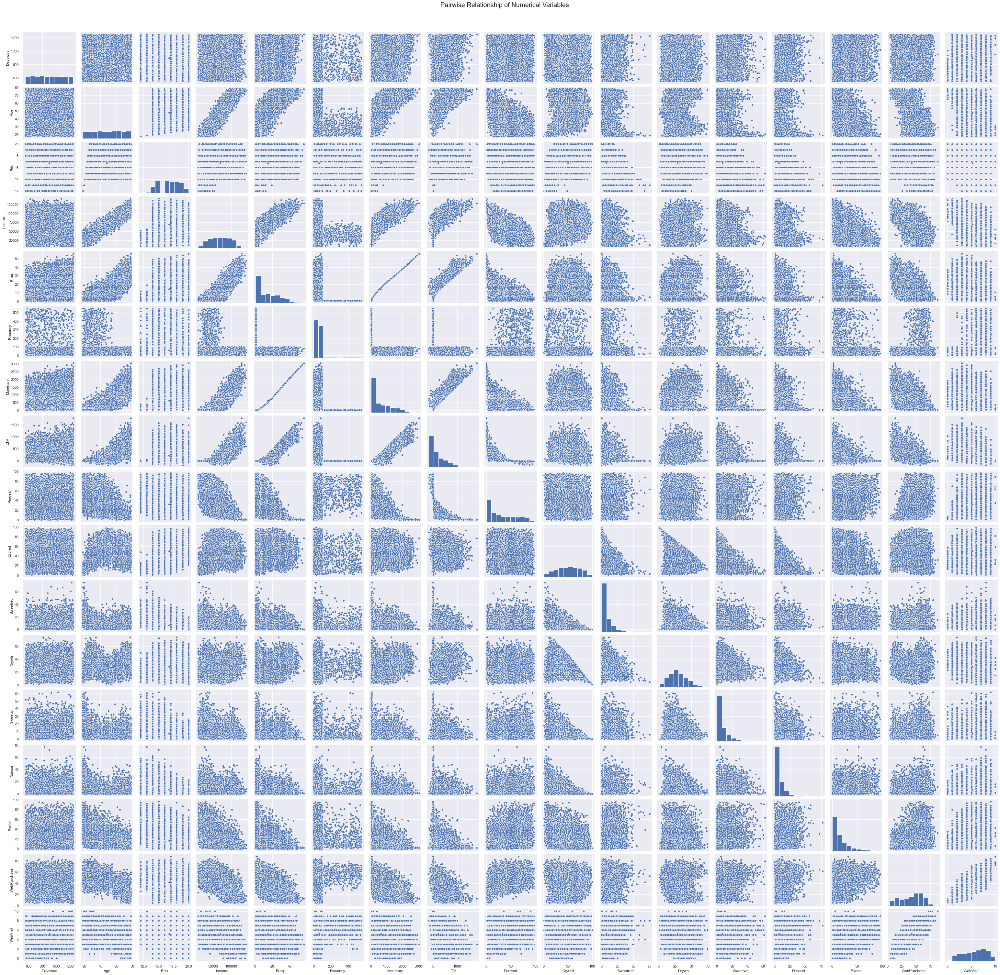

In [10]:
# Pairwise Relationship of Numerical Variables
sns.set()

# Setting pairplot
sns.pairplot(data[metric_features], diag_kind="hist")

# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

plt.show()

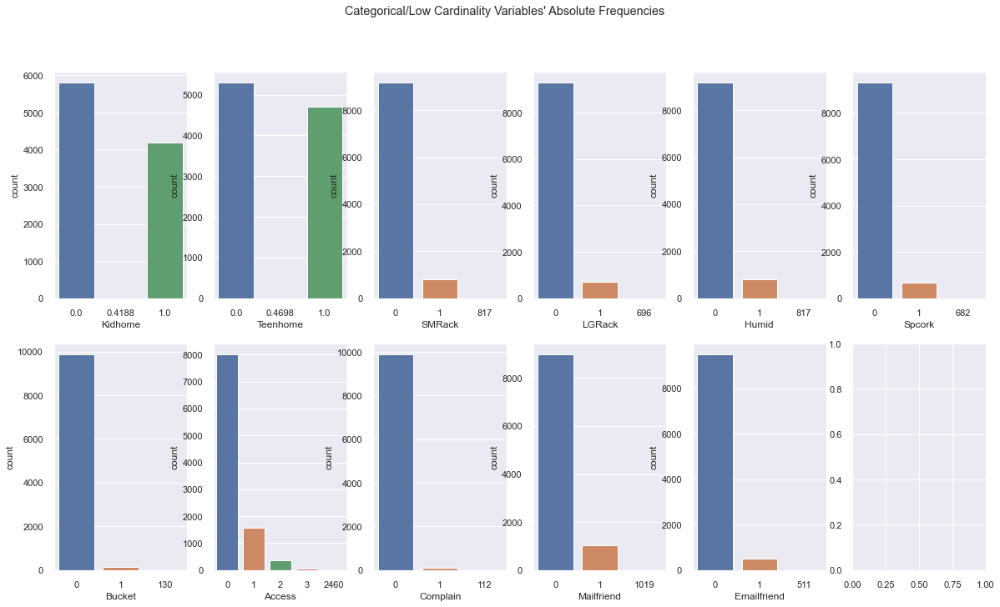

In [11]:
# All Non-Metric Variables' Absolute Frequencies
sns.set()

# Prepare figure. Create individual axes where each bar plot will be placed
fig, axes = plt.subplots(2, ceil(len(non_metric_features) / 2), figsize=(20, 11))

# Plot data
# Iterate across axes objects and associate each bar plot (hint: use the ax argument):
for ax, feat in zip(axes.flatten(), non_metric_features): # Notice the zip() function and flatten() method
    sns.countplot(data[feat], ax=ax)

title = "Categorical/Low Cardinality Variables' Absolute Frequencies"
plt.suptitle(title)

plt.show()

In [12]:
data[data["Age"]<18.0]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand


In [13]:
data[data["Freq"]==0]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand


In [14]:
data[data["Recency"]>550]

,Custid,Dayswus,Age,Edu,Income,Kidhome,Teenhome,Freq,Recency,Monetary,...,SMRack,LGRack,Humid,Spcork,Bucket,Access,Complain,Mailfriend,Emailfriend,Rand


# 4. Data Preparation

## 4.1. Select data

In [15]:
# Preserving the original df without variables CustomerId and Rand
data_clean = data[metric_features]

## 4.2. Outliers

### 4.2.1. Manually-Univariate outliers

After visualizing the Boxplot of the numerical variables, it can be seen numerous outliers in 'LTV','Sweetred','Monetary','Dessert'.Therefore, the team decided to eliminate manually 

In [16]:
# LTV
data_clean['LTV'].sort_values(ascending=False)

4231    1791.0
65      1608.0
9551    1588.0
7145    1583.0
230     1549.0
         ...  
5770    -147.0
3567    -147.0
66      -160.0
3568    -168.0
265     -178.0
Name: LTV, Length: 10001, dtype: float64

In [17]:
# Sweetred
data_clean['Sweetred'].sort_values(ascending=False)

6233    75.0
4986    68.0
5127    67.0
6923    65.0
7253    61.0
        ... 
5388     0.0
4131     0.0
4128     0.0
8824     0.0
4553     0.0
Name: Sweetred, Length: 10001, dtype: float64

In [18]:
# Monetary
data_clean['Monetary'].sort_values(ascending=False)

4231    3052.0
4054    2938.0
9554    2936.0
7145    2878.0
9444    2823.0
         ...  
9698       8.0
7968       8.0
9166       7.0
3058       7.0
6672       6.0
Name: Monetary, Length: 10001, dtype: float64

In [19]:
# Dessert
data_clean['Dessert'].sort_values(ascending=False)

7019    77.0
8335    72.0
6353    62.0
7077    59.0
6387    58.0
        ... 
1457     0.0
3455     0.0
3458     0.0
6473     0.0
5616     0.0
Name: Dessert, Length: 10001, dtype: float64

In [20]:
filter1 = (
    (data_clean['LTV']!=1791.0)
    &
    (data_clean['Sweetred']<60)
    &
    (data_clean['Monetary']<2936.0)
    &
    (data_clean['Dessert']<70)
)

data_clean1 = data_clean[filter1]

In [21]:
print('Percentage of data kept after removing outliers:', np.round(data_clean1.shape[0] / data_clean.shape[0], 4))

Percentage of data kept after removing outliers: 0.999


The percentage of outliers is 0.001, which is too small. Therefore, We will use other two methods:IQR and Z-score.

### 4.2.2. IQR

In [22]:
#IQR

q25 = data_clean.quantile(.25)
q75 = data_clean.quantile(.75)
iqr = (q75 - q25)

upper_lim = q75 + 4 * iqr
lower_lim = q25 - 4 * iqr

columns = metric_features
filter2 = []
for column in columns:
    llim = lower_lim[column]
    ulim = upper_lim[column]
    filter2.append(data_clean[column].between(llim, ulim, inclusive=True))

filter2 = pd.Series(np.all(filter2, 0))
data_clean2 = data_clean[filter2]
print('Percentage of data kept after removing outliers:', np.round(data_clean2.shape[0] / data_clean.shape[0], 4))

NumExpr defaulting to 8 threads.


Percentage of data kept after removing outliers: 0.9571


Since with the default multiplier, the percentage of ouliers detected were almost 25% which is exaggerated. Therefore, we iteratively inserted a value for the multiplier until it gives a reasonable number (at most 5%).

In [23]:
#Z-Score
z_scores = stats.zscore(data_clean)
abs_z_scores = np.abs(z_scores)
filter3 = (abs_z_scores < 3).all(axis=1)
filter3 = pd.Series(filter3)
data_clean3 = data_clean[filter3]
print('Percentage of data kept after removing outliers:', np.round(data_clean3.shape[0] / data_clean.shape[0], 4))

Percentage of data kept after removing outliers: 0.8923


In [24]:
#Combining IQR and Z-Score methods
data_clean4 = data_clean[(filter2 | filter3)]
print('Percentage of data kept after removing outliers:', np.round(data_clean4.shape[0] / data_clean.shape[0], 4))

Percentage of data kept after removing outliers: 0.9571


The z-score alone was the one that detected the biggest amount of outliers.

In [25]:
dataco = data_clean2
outliers = data_clean[filter2 == False]

In [26]:
dataco

,Dayswus,Age,Edu,Income,Freq,Recency,Monetary,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
0,653.000,55.0000,20.0000,78473.000,20.0000,18.0000,826.0000,445.0000,7.0000,67.0000,4.0000,26.0000,2.0000,1.0000,1.0000,36.0000,5.0000
1,1041.000,75.0000,18.0000,105087.000,36.0000,33.0000,1852.0000,539.0000,2.0000,49.0000,0.0000,46.0000,1.0000,3.0000,0.0000,20.0000,4.0000
2,666.000,18.0000,12.0000,27984.000,4.0000,56.0000,39.0000,-7.0000,88.0000,4.0000,29.0000,14.0000,32.0000,21.0000,48.0000,60.0000,8.0000
3,1049.000,42.0000,16.0000,61748.000,2.0000,46.0000,37.0000,-6.0000,70.0000,86.0000,1.0000,11.0000,1.0000,1.0000,55.0000,59.0000,7.0000
4,837.000,47.0000,16.0000,65789.000,2.0000,3.0000,36.0000,4.0000,35.0000,85.0000,0.0000,12.0000,2.0000,1.0000,28.0000,63.0000,6.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,1132.000,57.0000,20.0000,81033.000,19.0000,59.0000,776.0000,187.0000,22.0000,78.0000,0.0000,20.0000,1.0000,1.0000,11.0000,27.0000,4.0000
9996,596.000,66.0000,15.0000,84714.000,18.0000,45.0000,720.0000,391.0000,5.0000,30.0000,12.0000,36.0000,10.0000,12.0000,13.0000,18.0000,2.0000
9997,619.000,18.0000,12.0000,40466.000,3.0000,65.0000,47.0000,5.0000,23.0000,6.0000,24.0000,10.0000,38.0000,22.0000,41.0000,58.0000,5.0000
9999,979.000,55.0000,16.0000,94926.000,25.0000,28.0000,1148.0000,293.0000,7.0000,63.0000,10.0000,13.0000,11.0000,3.0000,4.0000,34.0000,5.0000


## 4.3. Normalization

In [27]:
#Normalize
names = dataco.columns
# Create the Scaler object
scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_df = scaler.fit_transform(dataco)
scaled_df = pd.DataFrame(scaled_df, columns=names)
  
# Normalizing the Data 
normalized_data = normalize(scaled_df) 
  
# Converting the numpy array into a pandas DataFrame 
normalized_data = pd.DataFrame(normalized_data,columns=names) 

## 4.4. Redundacy

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x0000022B4722C2E0>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x0000022B4722C2E0>
Setting pcolormesh


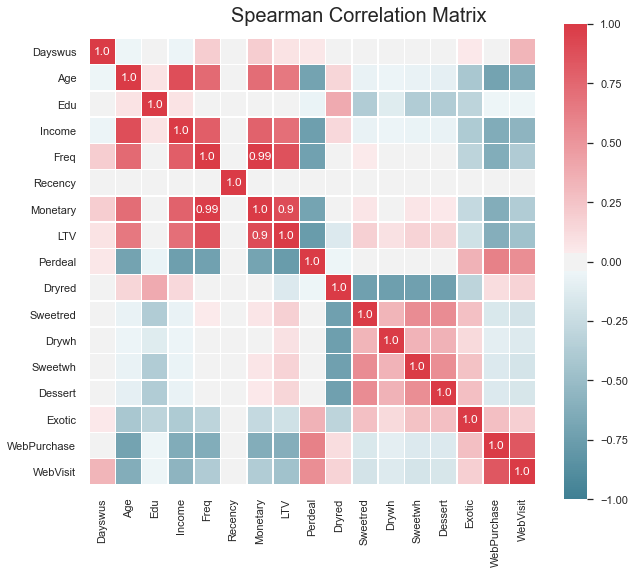

In [28]:
# Prepare figure
fig = plt.figure(figsize=(10,8))

# Obtain correlation matrix. Round the values to 2 decimal cases. Use the DataFrame corr() and round() method.
corr = np.round(normalized_data[metric_features].corr(method="spearman"), decimals=2)

# Build annotation matrix (values above |0.9| will appear annotated in the plot)
mask_annot = np.absolute(corr.values) >= 0.9
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

# Plot heatmap of the correlation matrix
sns.heatmap(data=corr, annot=annot,cmap=sns.diverging_palette(220, 10, as_cmap=True),fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)

# Layout
fig.subplots_adjust(top=0.95)
fig.suptitle("Spearman Correlation Matrix", fontsize=20)

plt.show()

In [29]:
#High correlation between Monetary and Freq. It was decided to eliminate Monetary as it also had another high correlated feature, LTV.
del normalized_data['Monetary']

In [30]:
normalized_data

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933


# 5. Clustering Functions

##### Clustering Functions

In [31]:
def number_clusters(df,cluster_model):
    metrics=['silhouette','distortion','calinski_harabasz']
    model=cluster_model
    for score in metrics:
        plt.figure()
        plt.ylabel(score)
        plt.xlabel('Number of clusters')
        Visualizer=KElbowVisualizer(model,metric=score).fit(df)
        plt.show

In [32]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [33]:
def gmm_config(data,limit_nrcomponents):
    bic_values =[]
    aic_values =[]
    types_covariance=['full','diag','spherical']
    for i in types_covariance:
        n_components = np.arange(1, limit_nrcomponents)
        models = [GaussianMixture(n, covariance_type=i, n_init=10, random_state=1).fit(data)
                  for n in n_components]
        bic_values.append([m.bic(data) for m in models])
        aic_values.append([m.aic(data) for m in models])
    #barplot for BIC
    bic=plt.figure(1)
    X = np.arange(1,limit_nrcomponents)
    plt.bar(X + 0.00, bic_values[0], label='full' ,color = 'b', width = 0.3)
    plt.bar(X + 0.25, bic_values[1], label='diag',color = 'g', width = 0.3)
    plt.bar(X + 0.50, bic_values[2], label='spherical',color = 'r', width = 0.3)
    plt.xlabel('number of components')
    plt.ylabel('BIC')
    plt.legend(loc='best')
   #barplot for AIC
    aic=plt.figure(2)
    X = np.arange(1,limit_nrcomponents)
    plt.bar(X + 0.00, aic_values[0], label='full' ,color = 'b', width = 0.3)
    plt.bar(X + 0.25, aic_values[1], label='diag',color = 'g', width = 0.3)
    plt.bar(X + 0.50, aic_values[2], label='spherical',color = 'r', width = 0.3)
    plt.xlabel('number of components')
    plt.ylabel('AIC')
    plt.legend(loc='best')
    bic.show
    aic.show

In [34]:
def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    def get_ss(df):
        ss = np.sum(df.var() * (df.count() - 1))
        return ss  # return sum of sum of squares of each df variable
    
    sst = get_ss(df)  # get total sum of squares
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) #get cluster labels
        df_concat = pd.concat((df, pd.Series(hclabels, name='labels')), axis=1)  # concat df with labels
        ssw_labels = df_concat.groupby(by='labels').apply(get_ss)  # compute ssw for each cluster labels
        ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
        r2.append(ssb / sst)  # save the R2 of the given cluster solution
        
    return np.array(r2)

In [35]:
#on 'type_covariance'-you have to insert with '', for example 'full'
def gmm_components(data,type_covariance,min_components,max_components):
    # Selecting number of components based on AIC and BIC
    n_components = np.arange(min_components,max_components)
    models = [GaussianMixture(n, covariance_type=type_covariance, n_init=10, random_state=1).fit(data)
              for n in n_components]

    bic_values = [m.bic(data) for m in models]
    aic_values = [m.aic(data) for m in models]
    plt.plot(n_components, bic_values, label='BIC')
    plt.plot(n_components, aic_values, label='AIC')
    plt.legend(loc='best')
    plt.xlabel('n_components')
    plt.xticks(n_components)
    plt.show()

In [36]:
perspective = normalized_data
perspective.head()

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053


## 5.1. KMeans

### 5.1.2- K-Elbow plots

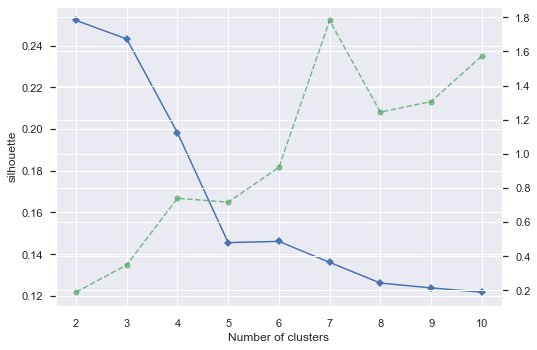

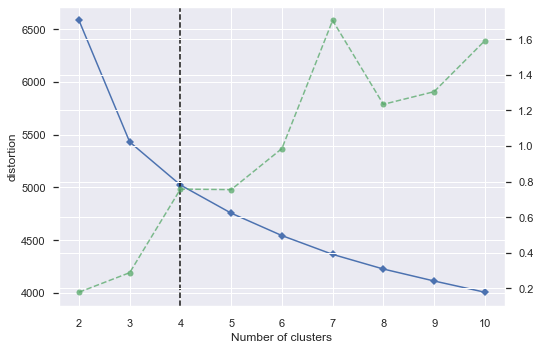

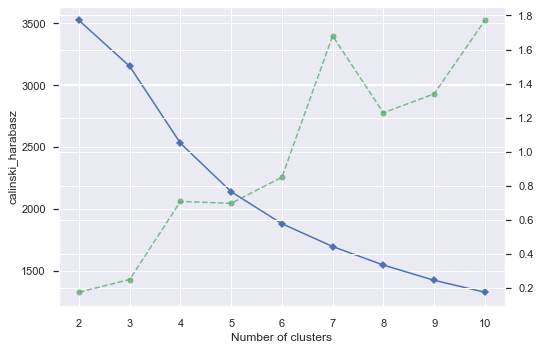

In [37]:
number_clusters(perspective,KMeans( init='k-means++', n_init=15, random_state=1))

### 5.1.2. Silhouette Analysis

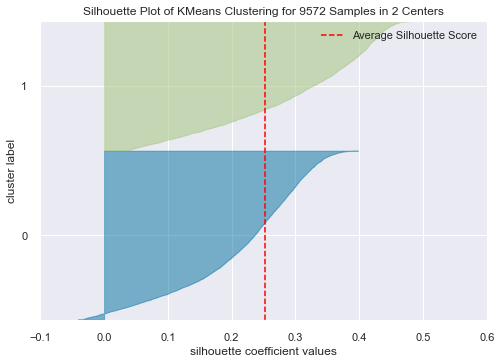

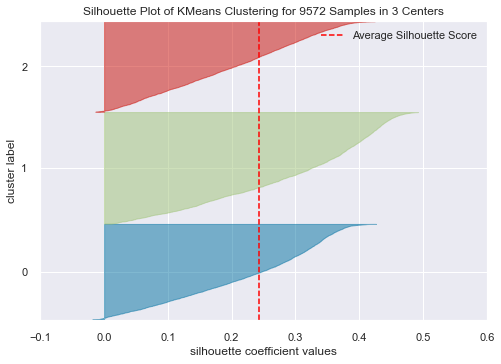

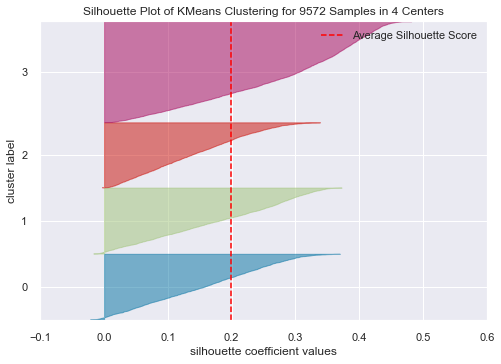

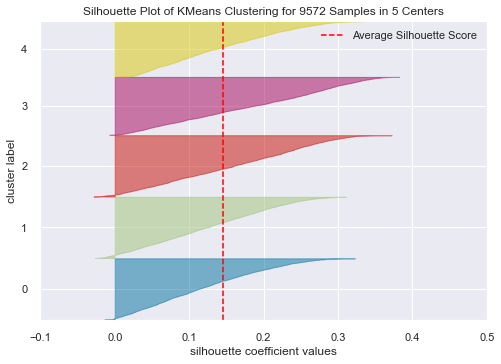

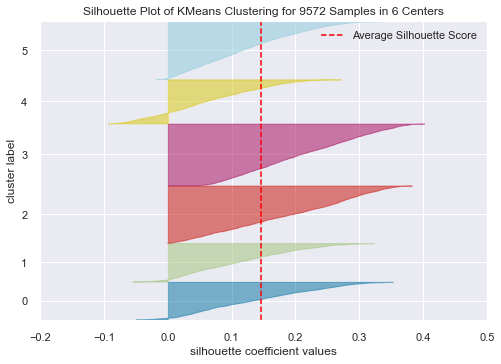

In [38]:
[SilhouetteVisualizer(KMeans(n_clusters=i,init='k-means++', n_init=15, random_state=1), colors='yellowbrick').fit(perspective).show() for i in range(2,7)]

### 5.1.3. Applying the clustering

In [39]:
#According to the KElbowVisualizer and the SilhouetteVisualizer we were able to determine that the optimal number of clusters is 5.
#confirmar nº de k
kmclust = KMeans(n_clusters=4, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(perspective)
df_concat = pd.concat((perspective, pd.Series(km_labels, name='labels')), axis=1)
df_concat.groupby('labels').mean()

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
labels,,,,,,,,,,,,,,,,
0,0.005815,0.061013,0.125541,0.060034,0.006456,-0.018728,-0.062786,-0.099956,0.364646,-0.200682,-0.319886,-0.202386,-0.203263,-0.110495,0.070589,0.089254
1,-0.012624,-0.224277,-0.164038,-0.211841,-0.179950,0.006207,-0.153400,0.137653,-0.221268,0.187270,0.079786,0.185599,0.195418,0.182295,0.135759,0.103557
2,0.020491,-0.205798,0.092253,-0.202004,-0.230153,0.009894,-0.218116,0.288809,0.103298,-0.131957,0.031431,-0.125435,-0.127402,0.013236,0.211968,0.196703
3,-0.013677,0.254620,0.000649,0.241335,0.230342,-0.017442,0.218947,-0.228445,-0.059785,0.014177,0.087205,0.013088,0.011633,-0.112272,-0.254744,-0.234658


In [40]:
#Making a copy of the dataset and appending a column with the cluster assigned to the observation.
km_perspective = perspective.copy()
km_perspective["km_labels"] = km_labels
km_perspective

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,km_labels
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,0
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,3
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,1
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,2
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,0
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,3
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,1
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,3


### 5.1.4. Cluster Profile

TypeError: annotate() missing 1 required positional argument: 's'

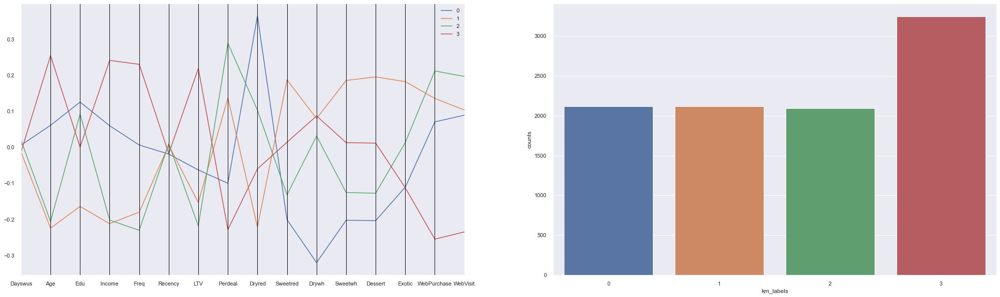

In [41]:
cluster_profiles(km_perspective, ["km_labels"],(35,10), compar_titles=None)

## 5.2. GMM
### 5.2.1. Choosing the type of covariance

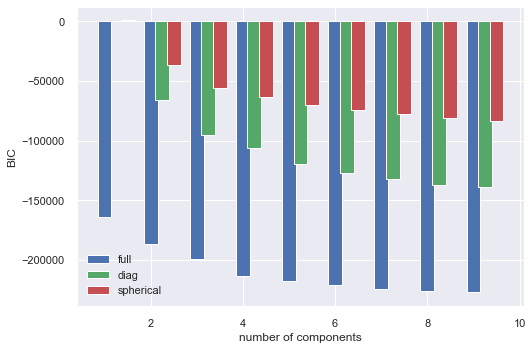

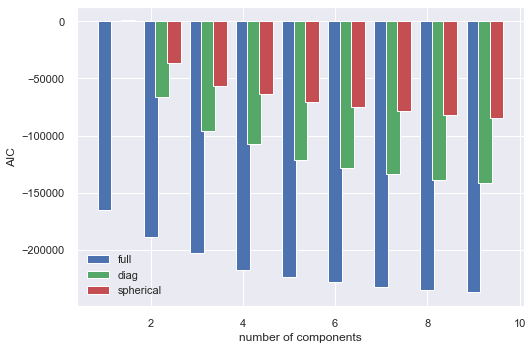

In [42]:
gmm_config(perspective,10)

For the most part, the number of components the model with the lowest AIC and BIC is 'full' 
### 5.2.2. Find the number of components

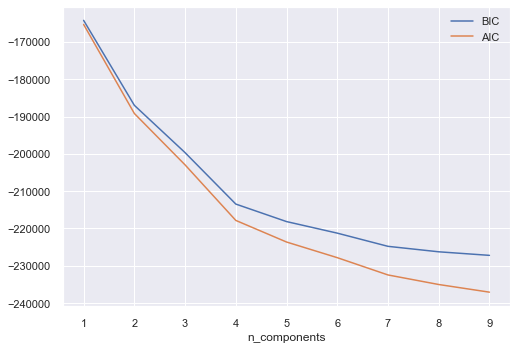

In [43]:
gmm_components(perspective,'full',1,10)

According to the graph, the teams considers the optimal number of components is 4.

### 5.2.3. Applying the clustering

In [44]:
# Performing GMM clustering
gmm = GaussianMixture(n_components=4, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
gmm_labels = gmm.fit_predict(perspective)
# Concatenating the labels to df
df_concat = pd.concat([perspective, pd.Series(gmm_labels, index=perspective.index, name="gmm_labels")], axis=1)
df_concat.head()

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,gmm_labels
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,3
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,0
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,2
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1


In [45]:
gmm_perspective = perspective.copy()
gmm_perspective["gmm_labels"] = gmm_labels
gmm_perspective

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,gmm_labels
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,3
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,0
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,2
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,1
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,0
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,2
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,3


### 5.2.4. Cluster Profilling

TypeError: annotate() missing 1 required positional argument: 's'

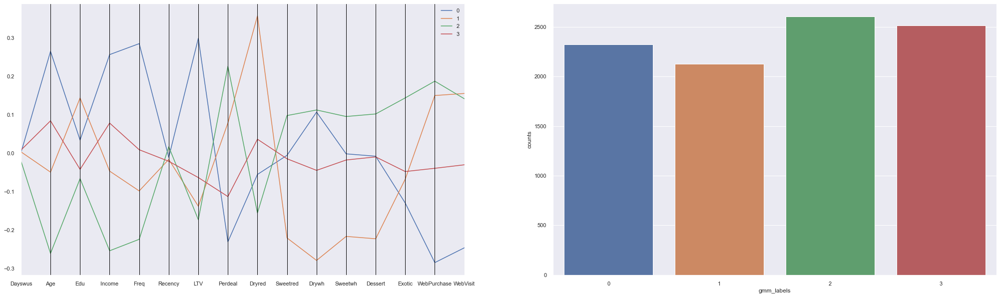

In [46]:
cluster_profiles(gmm_perspective, ["gmm_labels"], (35,10) , compar_titles=None)

## 5.3- K-means + SOM
### 5.3.1. tem que ter algo

In [47]:
# This som implementation does not have a random seed parameter
# We're going to set it up ourselves
np.random.seed(42)

# Notice that the SOM did not converge - We're under a time constraint for this class
sm = sompy.SOMFactory().build(
    perspective.values, 
    mapsize=(50, 50), 
    initialization='random',
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.469000, quantization error: 3.654167

 epoch: 2 ---> elapsed time:  0.514000, quantization error: 3.985913

 epoch: 3 ---> elapsed time:  0.516000, quantization error: 3.946739

 epoch: 4 ---> elapsed time:  0.485000, quantization error: 3.922813

 epoch: 5 ---> elapsed time:  0.516000, quantization error: 3.910285

 epoch: 6 ---> elapsed time:  0.553000, quantization error: 3.906156

 epoch: 7 ---> elapsed time:  0.497000, quantization error: 3.904157

 epoch: 8 ---> elapsed time:  0.543000, quantization error: 3.902369

 epoch: 9 ---> elapsed time:  0.514000, quantization error: 3.900602

 epoch: 10 ---> elapsed time:  0.506000, quantization error: 3.898801

 epoch: 11 ---> elapsed time:  0.499000, quantization error: 3.896876

 epoch: 12 ---> elapsed time:  0.533000, quantization error: 3.894640

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.487000, quantization error: 2.875392

 epoch: 15 ---> elapsed time:  0.508000, quantization error: 2.866966

 epoch: 16 ---> elapsed time:  0.498000, quantization error: 2.858571

 epoch: 17 ---> elapsed time:  0.507000, quantization error: 2.850179

 epoch: 18 ---> elapsed time:  0.514000, quantization error: 2.841755

 epoch: 19 ---> elapsed time:  0.489000, quantization error: 2.833327

 epoch: 20 ---> elapsed time:  0.488000, quantization error: 2.824821

 epoch: 21 ---> elapsed time:  0.526000, quantization error: 2.816306

 epoch: 22 ---> elapsed time:  0.506000, quantization error: 2.807607

 epoch: 23 ---> elapsed time:  0.485000, quantization error: 2.798869

 epoch: 24 ---> elapsed time:  0.526000, quantization error: 2.790312

 epoch: 25 ---> elapsed time:  0.506000, quantization error: 2.781692

 epoch: 26 ---> elapsed time:  0.515000, quantization error: 2.773115

 epoch: 27 ---> elapsed time:  0.515000, quantization error: 2.764417

 epoch

In [48]:
# Coordinates of the units in the input space
som_units=sm.get_node_vectors()

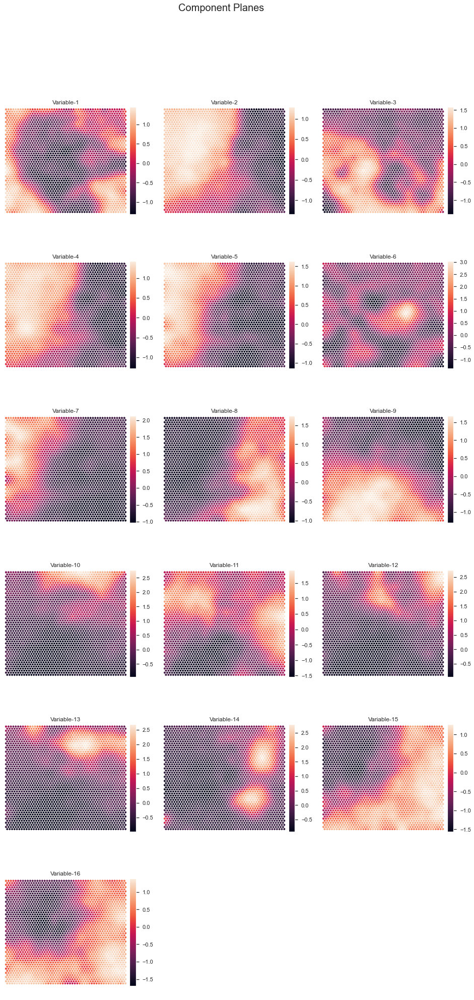

In [49]:
# Component planes on the 50x50 grid
sns.set()
view2D = View2D(12,12,"", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

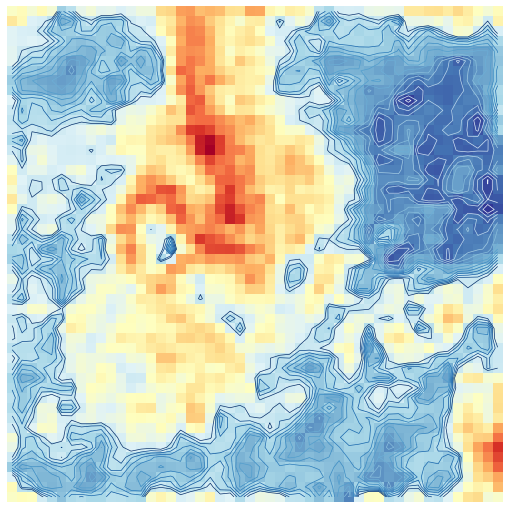

In [50]:
# U-matrix of the 50x50 grid
u = sompy.umatrix.UMatrixView(12, 12, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance2=1, 
    row_normalized=False, 
    show_data=False, 
    contooor=True # Visualize isomorphic curves
)

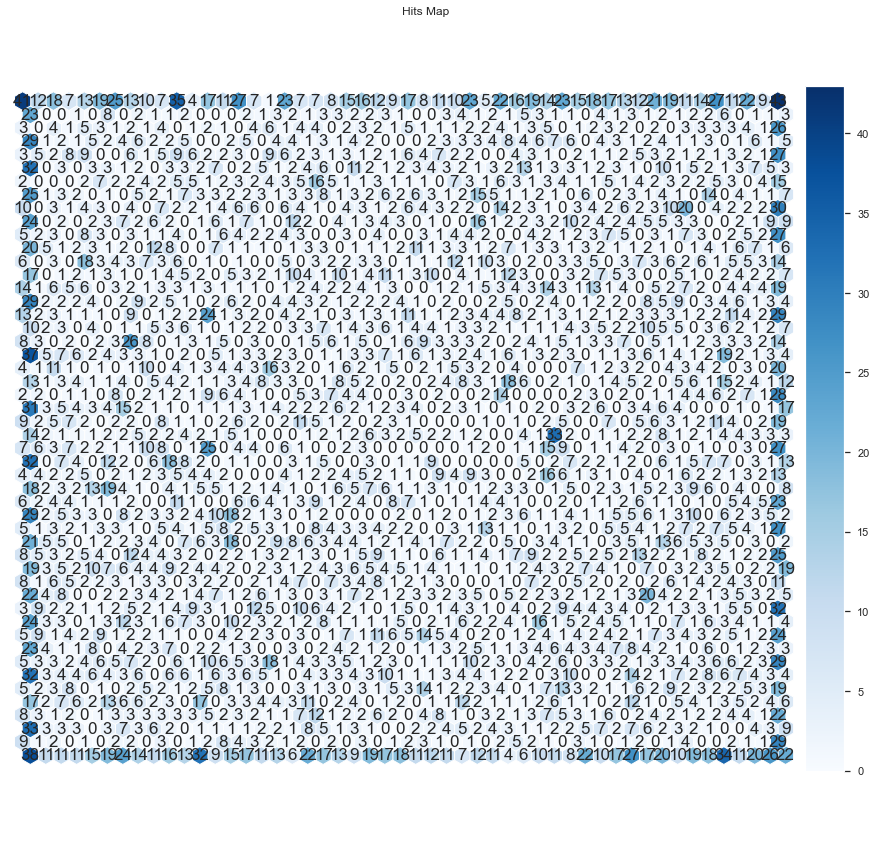

In [51]:
#HIT-MAP
vhts  = BmuHitsView(15,15,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=17, cmap="Blues")
plt.show()

### 5.3.2. Number of clusters

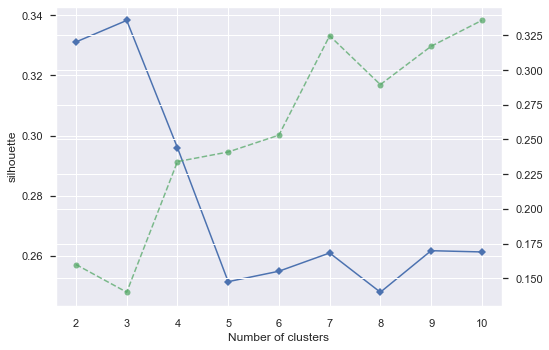

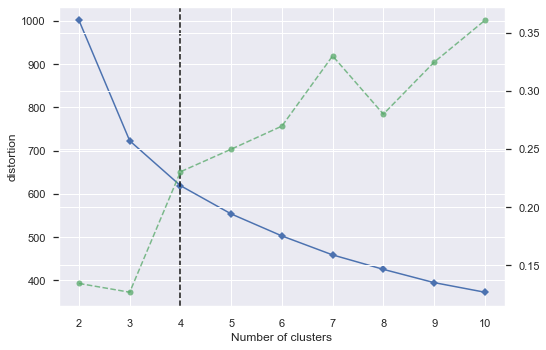

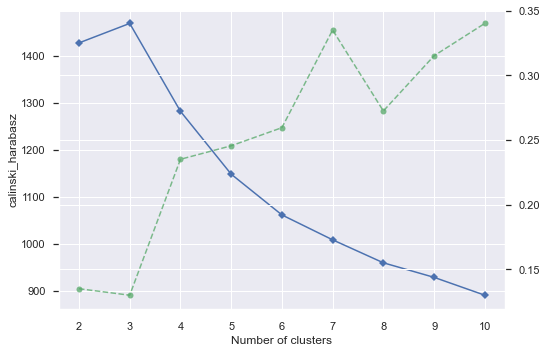

In [52]:
number_clusters(som_units,KMeans( init='k-means++', n_init=15, random_state=1))

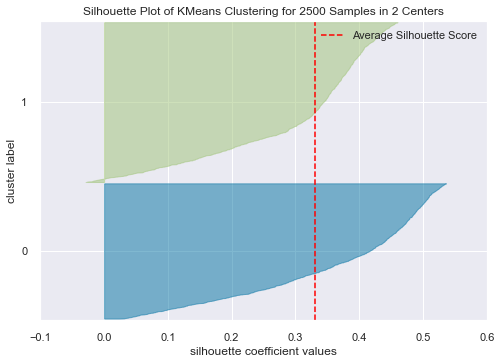

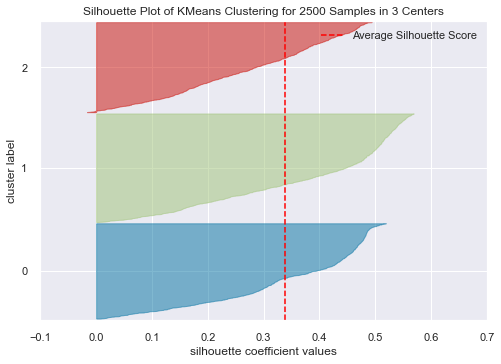

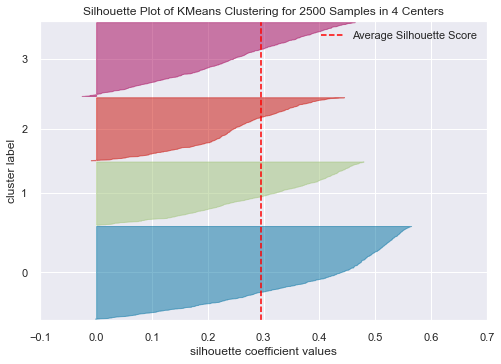

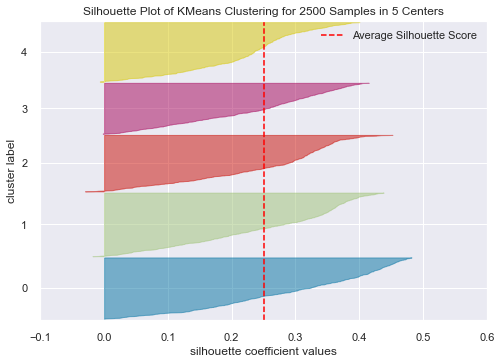

In [53]:
[SilhouetteVisualizer(KMeans(n_clusters=i,init='k-means++', n_init=15, random_state=1), colors='yellowbrick').fit(som_units).show() for i in range(2,6)]

### 5.3.3.  Apply the clustering 

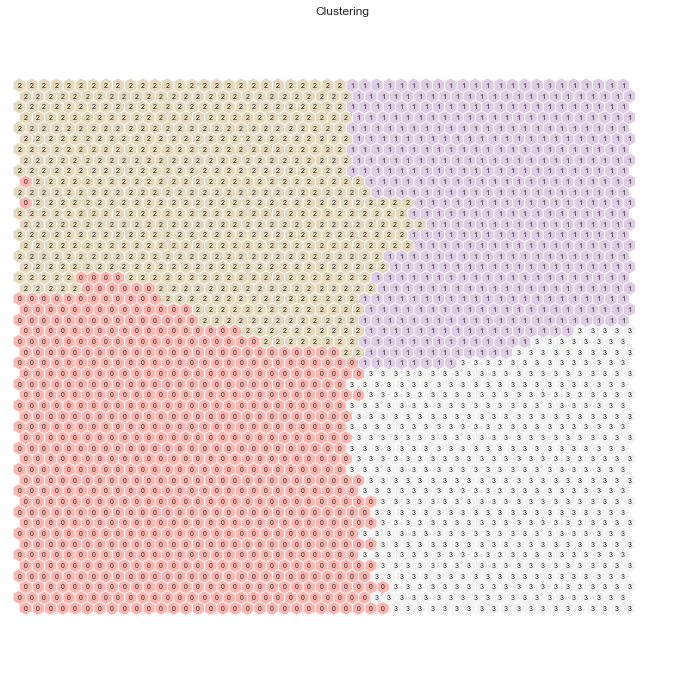

In [54]:
# Perform K-Means clustering on top of the 2500 untis (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels_KM = sm.cluster(kmeans)

hits  = HitMapView(12, 12,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

In [55]:
perspective_nodes_KM = pd.DataFrame(som_units)
perspective_nodes_KM['label'] = nodeclus_labels_KM
perspective_nodes_KM

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,label
0,0.074287,-0.234733,-0.148529,-0.210282,-0.167515,-0.038471,-0.146635,0.126556,-0.230915,0.238423,-0.020175,0.551049,-0.037122,0.016235,0.129240,0.134473,3
1,0.013826,-0.247747,-0.171555,-0.218869,-0.165050,-0.027169,-0.138353,0.116474,-0.261896,0.302907,-0.015560,0.550178,-0.009391,0.070180,0.121023,0.100606,3
2,-0.017961,-0.250297,-0.180104,-0.223221,-0.168191,-0.016263,-0.134708,0.121306,-0.270004,0.323490,-0.006351,0.530119,0.001646,0.173539,0.115004,0.076987,3
3,0.001087,-0.240514,-0.185773,-0.212812,-0.156990,-0.002775,-0.126681,0.111768,-0.257326,0.345765,-0.043441,0.499047,0.038778,0.278962,0.101830,0.074478,3
4,-0.001385,-0.229430,-0.161171,-0.202012,-0.154019,-0.016249,-0.124352,0.110563,-0.241054,0.344478,-0.068580,0.459473,0.074144,0.393446,0.083360,0.054998,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,0.208449,0.012787,-0.212950,0.040863,0.079743,-0.184840,-0.046315,-0.114479,0.378055,-0.220199,-0.327535,-0.203788,-0.209590,-0.111743,0.232046,0.321771,2
2496,0.160892,0.027161,-0.266292,0.051949,0.088625,-0.056409,-0.027973,-0.135864,0.374132,-0.215135,-0.322912,-0.201317,-0.211612,-0.130645,0.217802,0.304669,2
2497,0.141608,0.032152,-0.297281,0.053658,0.091470,0.090676,-0.020123,-0.147013,0.366313,-0.218193,-0.307010,-0.196036,-0.216827,-0.135514,0.197523,0.292134,2
2498,0.202934,0.028616,-0.326770,0.054721,0.081223,0.187941,-0.047011,-0.124507,0.331473,-0.195769,-0.274448,-0.187292,-0.191753,-0.128126,0.190657,0.286643,2


In [56]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(perspective)[0]  # get bmus for each observation in df

perspective_bmus = pd.DataFrame(
    np.concatenate((perspective, np.expand_dims(bmus_map,1)), axis=1),
    index=perspective.index, columns=np.append(perspective.columns,"BMU")
)
perspective_bmus

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,BMU
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,1129.0
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,2098.0
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,719.0
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1866.0
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1968.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,1499.0
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,973.0
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,921.0
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,2148.0


In [57]:
# Get cluster labels for each observation
perspective_final_KMSOM =perspective_bmus.merge(perspective_nodes_KM['label'], 'left', left_on="BMU", right_index=True)
perspective_final_KMSOM

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,BMU,label
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,1129.0,0
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,2098.0,2
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,719.0,3
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1866.0,1
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1968.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,1499.0,0
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,973.0,0
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,921.0,3
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,2148.0,2


In [58]:
# Characterizing the final clusters
perspective_final_KMSOM.drop(columns='BMU').groupby('label').mean()

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
label,,,,,,,,,,,,,,,,
0,-0.101579,0.243585,0.026031,0.222486,0.172220,-0.047925,0.164276,-0.216787,-0.086563,0.040084,0.108381,0.028753,0.017876,-0.115065,-0.265254,-0.285951
1,0.010434,-0.209385,0.053471,-0.204495,-0.223714,0.071551,-0.203259,0.243044,0.051550,-0.069183,0.039033,-0.081947,-0.081983,0.030460,0.207611,0.188674
2,0.073237,0.121240,0.042116,0.124622,0.115567,-0.016540,0.056443,-0.136677,0.237807,-0.141352,-0.196463,-0.139609,-0.135044,-0.090329,-0.018087,0.034378
3,-0.021094,-0.226975,-0.156586,-0.216445,-0.175698,-0.065826,-0.146123,0.146382,-0.239704,0.189554,0.057748,0.230907,0.246189,0.196591,0.116764,0.077490


### 5.3.4. Cluster Profiles

TypeError: annotate() missing 1 required positional argument: 's'

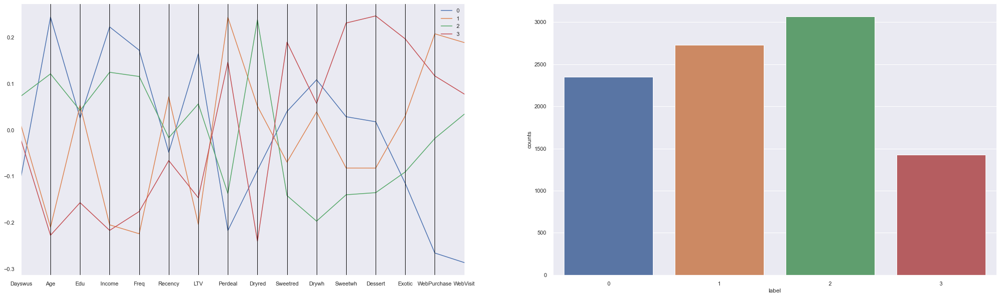

In [59]:
cluster_profiles(perspective_final_KMSOM.drop('BMU',axis=1), ["label"], (35,10), compar_titles=None)

## 5.4. Hierarchical Clustering on top of SOM units
### 4.4.1. R2 plot

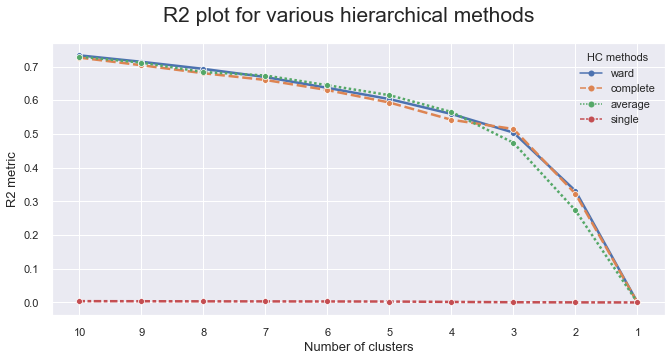

In [60]:
# Prepare input
hc_methods = ["ward", "complete", "average", "single"]
# Call function defined above to obtain the R2 statistic for each hc_method
max_nclus = 10
r2_hc_methods = np.vstack([get_r2_hc(df=pd.DataFrame(som_units), link_method=link, max_nclus=max_nclus) for link in hc_methods]).T
r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

sns.set()
# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
plt.gca().invert_xaxis()  # invert x axis
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

plt.show()

In [61]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'
hclust = AgglomerativeClustering(linkage=linkage, affinity=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(pd.DataFrame(som_units))

array([2068, 2072, 2217, ...,    1,    2,    0], dtype=int64)

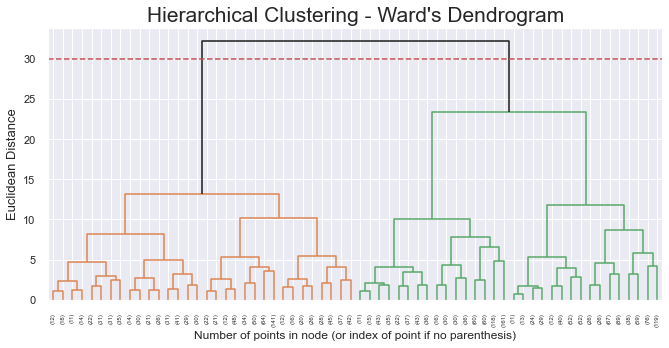

In [62]:
# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# setting the threshold
y_threshold = 30
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

### 5.4.3. Number of clusters

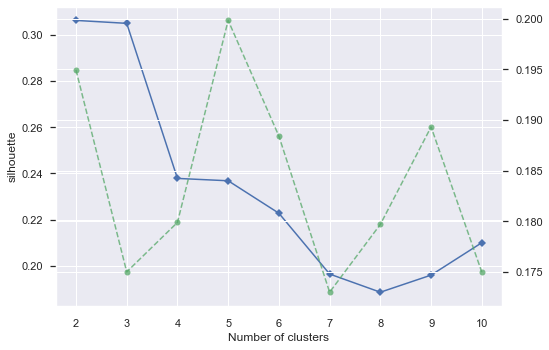

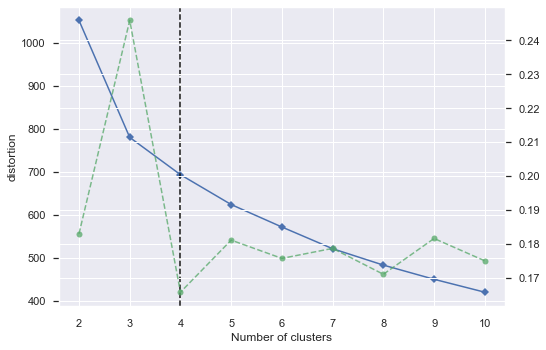

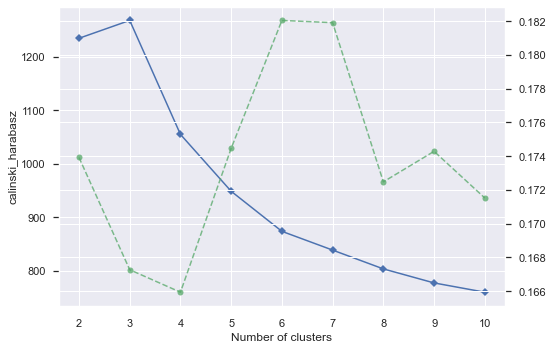

In [63]:
number_clusters(som_units, AgglomerativeClustering(linkage=linkage))

### 5.4.4- Applying the Clustering

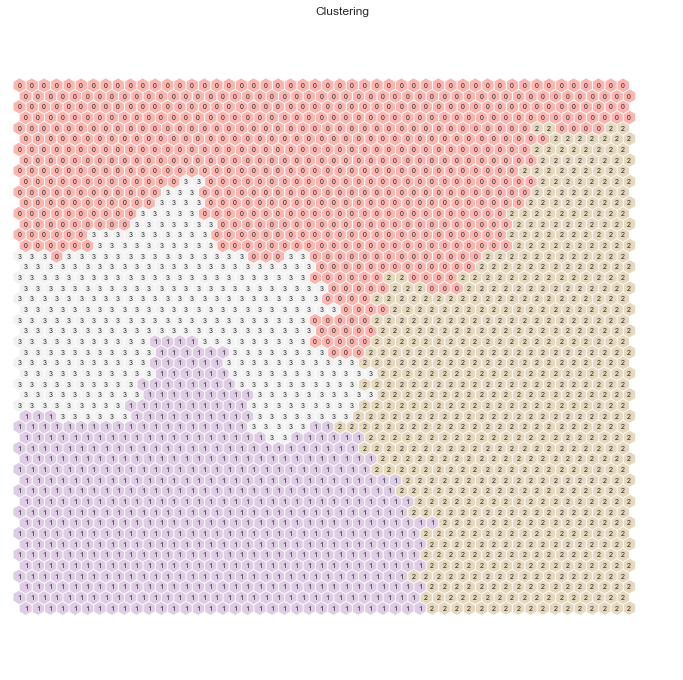

In [64]:
# Perform Hierarchical clustering on top of the 2500 untis (sm.get_node_vectors() output)
hierclust = AgglomerativeClustering(n_clusters=4, linkage='ward')
nodeclus_labels_HC= sm.cluster(hierclust)
hits  = HitMapView(12, 12,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")
plt.show()

In [65]:
# Check the nodes and and respective clusters
nodes = sm.get_node_vectors()
perspective_nodes_HC = pd.DataFrame(nodes)
perspective_nodes_HC['label'] = nodeclus_labels_HC
perspective_nodes_HC

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,label
0,0.074287,-0.234733,-0.148529,-0.210282,-0.167515,-0.038471,-0.146635,0.126556,-0.230915,0.238423,-0.020175,0.551049,-0.037122,0.016235,0.129240,0.134473,2
1,0.013826,-0.247747,-0.171555,-0.218869,-0.165050,-0.027169,-0.138353,0.116474,-0.261896,0.302907,-0.015560,0.550178,-0.009391,0.070180,0.121023,0.100606,2
2,-0.017961,-0.250297,-0.180104,-0.223221,-0.168191,-0.016263,-0.134708,0.121306,-0.270004,0.323490,-0.006351,0.530119,0.001646,0.173539,0.115004,0.076987,2
3,0.001087,-0.240514,-0.185773,-0.212812,-0.156990,-0.002775,-0.126681,0.111768,-0.257326,0.345765,-0.043441,0.499047,0.038778,0.278962,0.101830,0.074478,2
4,-0.001385,-0.229430,-0.161171,-0.202012,-0.154019,-0.016249,-0.124352,0.110563,-0.241054,0.344478,-0.068580,0.459473,0.074144,0.393446,0.083360,0.054998,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2495,0.208449,0.012787,-0.212950,0.040863,0.079743,-0.184840,-0.046315,-0.114479,0.378055,-0.220199,-0.327535,-0.203788,-0.209590,-0.111743,0.232046,0.321771,0
2496,0.160892,0.027161,-0.266292,0.051949,0.088625,-0.056409,-0.027973,-0.135864,0.374132,-0.215135,-0.322912,-0.201317,-0.211612,-0.130645,0.217802,0.304669,0
2497,0.141608,0.032152,-0.297281,0.053658,0.091470,0.090676,-0.020123,-0.147013,0.366313,-0.218193,-0.307010,-0.196036,-0.216827,-0.135514,0.197523,0.292134,0
2498,0.202934,0.028616,-0.326770,0.054721,0.081223,0.187941,-0.047011,-0.124507,0.331473,-0.195769,-0.274448,-0.187292,-0.191753,-0.128126,0.190657,0.286643,0


In [66]:
# Obtaining SOM's BMUs labels
bmus_map = sm.find_bmu(perspective)[0]  # get bmus for each observation in df

perspective_bmus = pd.DataFrame(
    np.concatenate((perspective, np.expand_dims(bmus_map,1)), axis=1),
    index=perspective.index, columns=np.append(perspective.columns,"BMU")
)
perspective_bmus

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,BMU
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,1129.0
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,2098.0
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,719.0
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1866.0
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1968.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,1499.0
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,973.0
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,921.0
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,2148.0


In [67]:
# Get cluster labels for each observation
perspective_final_HC = perspective_bmus.merge(perspective_nodes_HC['label'], 'left', left_on="BMU", right_index=True)
perspective_final_HC_r2 = perspective_final_HC.copy()
perspective_final_HC

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit,BMU,label
0,-0.386685,0.115790,0.551252,0.084099,0.128873,-0.315187,0.245044,-0.280078,0.216859,-0.120083,-0.066358,-0.204709,-0.254278,-0.285284,-0.098759,-0.022023,1129.0,3
1,0.156308,0.343155,0.144543,0.276990,0.389456,-0.124698,0.242769,-0.236567,-0.022881,-0.205752,0.307861,-0.173830,-0.113453,-0.213417,-0.261745,-0.110662,2098.0,0
2,-0.151430,-0.238120,-0.342623,-0.209300,-0.123218,0.013431,-0.100270,0.269407,-0.271403,0.398772,-0.152883,0.453084,0.276804,0.256500,0.129568,0.159453,719.0,2
3,0.170299,-0.091967,-0.100257,-0.080551,-0.253960,-0.042648,-0.174499,0.321304,0.347085,-0.180853,-0.322071,-0.179285,-0.183778,0.545868,0.214083,0.180518,1866.0,0
4,-0.085694,-0.029673,-0.121884,-0.056412,-0.308742,-0.397524,-0.202662,0.036889,0.409776,-0.257984,-0.369330,-0.179867,-0.223421,0.206477,0.320618,0.100053,1968.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9567,0.366237,0.153253,0.551514,0.114085,0.102241,0.059961,-0.033271,-0.107596,0.369514,-0.293754,-0.218168,-0.248179,-0.254399,-0.092632,-0.253431,-0.157993,1499.0,3
9568,-0.434316,0.293128,-0.283801,0.143237,0.068861,-0.062155,0.170344,-0.276390,-0.269954,0.206990,0.170061,0.129592,0.231444,-0.049289,-0.371943,-0.391863,973.0,3
9569,-0.188526,-0.246703,-0.354973,-0.154329,-0.139088,0.049187,-0.098339,-0.041140,-0.269310,0.320229,-0.201716,0.580836,0.306566,0.207966,0.119527,-0.009434,921.0,2
9570,0.147930,0.136350,-0.163348,0.325560,0.308848,-0.263414,0.095482,-0.329809,0.190073,0.165111,-0.465200,0.218390,-0.190648,-0.267866,-0.156738,-0.025933,2148.0,0


In [68]:
# Characterizing the final clusters
perspective_final_HC.drop(columns='BMU').groupby('label').mean()

,Dayswus,Age,Edu,Income,Freq,Recency,LTV,Perdeal,Dryred,Sweetred,Drywh,Sweetwh,Dessert,Exotic,WebPurchase,WebVisit
label,,,,,,,,,,,,,,,,
0,0.054641,0.051318,0.028797,0.053212,0.029250,-0.047035,-0.016730,-0.034690,0.237611,-0.148359,-0.185228,-0.144357,-0.142327,-0.051161,0.042794,0.077891
1,0.045830,0.198484,-0.188018,0.195167,0.193969,-0.024847,0.191161,-0.193224,-0.182448,0.150909,0.027751,0.263730,0.116400,-0.057518,-0.178989,-0.153762
2,0.006902,-0.236235,-0.033058,-0.226877,-0.204541,0.072000,-0.174236,0.197602,-0.117036,0.060622,0.092068,0.074786,0.077862,0.100911,0.178517,0.152215
3,-0.108392,0.210813,0.073562,0.191864,0.142502,-0.040352,0.133724,-0.191581,-0.059233,0.024143,0.102271,-0.016673,0.003554,-0.116441,-0.244663,-0.268205


### 5.4.5. Cluster Profiles

TypeError: annotate() missing 1 required positional argument: 's'

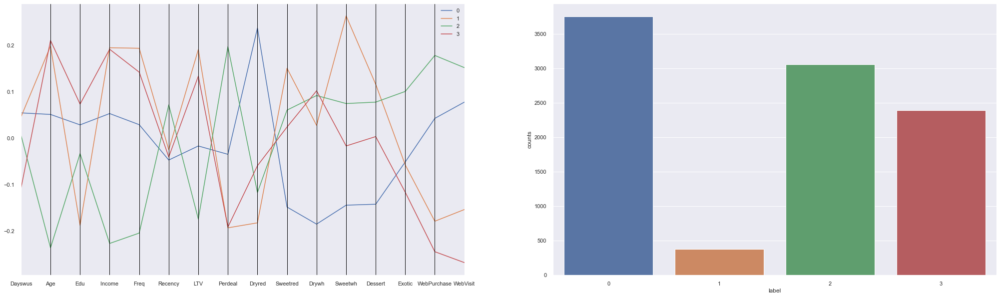

In [69]:
cluster_profiles(perspective_final_HC.drop('BMU',axis=1), ["label"], (35,10), compar_titles=None)

## 5.5. Hierarquical Clustering

# 6. Comparing each clustering method

To compare the diferrent clustering methods we decid to use the R2 as a metric evaluation of each method

In [74]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable
def r2(df, labels):
    sst = get_ss(df)
    ssw = np.sum(df.groupby(labels).apply(get_ss))
    return 1 - ssw/sst

In [75]:
print('The r2 of the k-means method is', r2(km_perspective, 'km_labels').round(2))
print('The r2 of the GMM method is', r2(gmm_perspective, 'gmm_labels').round(2))
print('The r2 of the k-means + SOM method is', r2(perspective_final_KMSOM, 'label').round(2))
print('The r2 of the HC + Som method is', r2(perspective_final_HC_r2, 'label').round(2))              

The r2 of the k-means method is 0.77
The r2 of the GMM method is 0.73
The r2 of the k-means + SOM method is 0.55
The r2 of the HC + Som method is 0.61
